In [65]:
import re
import matplotlib.pyplot as plt
import numpy as np
import itertools

In [66]:
delta_H_infile = open("delta_H_hmc_output_new_S.txt","r")
for line in delta_H_infile:
    tokensH = line.split()


delta_H_list = [float(del_H) for del_H in tokensH]
delta_H_list
np.mean(np.exp(-np.array(delta_H_list)))

1.0002363561896725

In [67]:

#infile = open("hmc_output_smaller_step.txt", "r")
infile = open("hmc_output_new_S.txt", "r")
s = infile.read()
tokens = s.split('[')[1:]

# we discard tokens[0]
for i,path in enumerate(tokens):
    new_path = re.sub('\]|\n', '', path)
    tokens[i] = new_path
#x_data = [path for path in tokens[1:]]
pathList = [[0]*len(tokens[0])]*len(tokens)
for i in range(len(tokens)):
    pathList[i] = [float(x_i) for x_i in tokens[i].split()]
    
# discard first 100 steps as thermalization
pathList = pathList[100:]

N_tau = len(pathList[0])
print(N_tau)
print(len(pathList))
print(pathList)

100
9900
[[0.626249682, 0.904296594, 0.918658776, 0.232626586, 0.0275207747, -1.31245163, 0.60306457, 0.122909483, -0.416968779, -0.45080262, -0.70048863, -0.225862351, 0.277735122, 0.104314147, -0.551515804, 0.426311886, 0.184864945, 0.243888189, 0.751780055, -0.145277462, -0.153922086, -1.16905158, -0.685432835, -0.414535874, 0.402719548, 1.20739847, 0.803529956, 0.45774075, 0.210911912, -0.0828323533, 0.000867797563, -0.0652647737, 0.160878205, 0.0482052483, -0.269012694, 0.206549331, -0.527407353, -0.462320025, -0.622872909, 0.333756813, 0.520945303, 0.691706945, -0.744511998, 0.646063105, -0.694122266, -1.02051893, -0.485491749, -1.01606138, 0.435538723, -0.567903837, -0.950236762, -0.733748963, -0.569937881, 0.145211088, 0.626425551, 1.30703362, -0.0548900364, 0.313243282, 0.788480711, 0.186369335, 0.755779744, -0.191489148, -0.611686701, -0.256578428, -1.08155131, -0.60151849, -0.261160742, 0.25822223, 0.259712495, -0.867977167, -0.00746365024, -0.960166882, -0.148282999, -0.199

0.004462815802797929


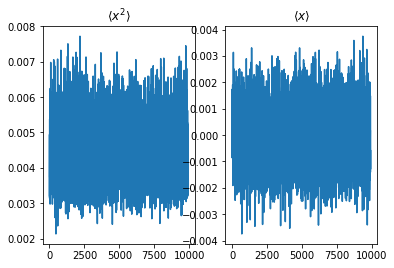

9900


In [68]:
# plotting <x> and <x^2> behaviour

N_sep = 1 # config sample frequency

#x_avg = [(1/N_tau)*np.mean(np.array(path)) for path in pathList[::N_sep]]
#x2_avg = [(1/N_tau)*np.mean(np.array(path)**2) for path in pathList[::N_sep]]
# the below are for plotting HMC, the above is for plotting ordinary standard MCMC
x_avg = [(1/N_tau)*np.mean(np.array(path)) for path in pathList]
x2_avg = [(1/N_tau)*np.mean(np.array(path)**2) for path in pathList]
print(np.mean(np.array(x2_avg)))
fig, (ax1,ax2) = plt.subplots(1,2) 
# ax1.xlabel("Config number")
ax1.set_title(r'$\langle x^2 \rangle$')
# ax1.plot([N_sep*i for i in range(int(len(pathList)/N_sep))], x2_avg) #per site
ax1.plot([i for i in range(len(x_avg))], x2_avg) #per site
ax2.set_title(r'$\langle x \rangle$')
#ax2.xlabel("Config number")
#ax2.ylabel(r'$\langle x \rangle')
ax2.plot([i for i in range(int(len(pathList)/N_sep))], x_avg) # per site 
plt.show()

print(len(x_avg))

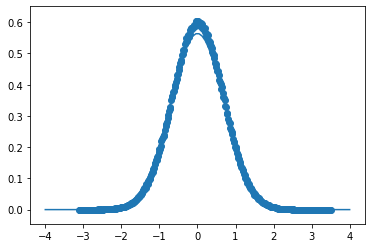

In [69]:

#psi_0 = np.histogram([np.mean(path) for path in pathList],bins='auto', density=True)
# REMEMBER THAT WE DON'T HAVE TO SQUARE psi_0 BECAUSE IN FORMING A HISTOGRAM, WE GET A PROBABILITY DENSITY FOR x, WHICH IS 
# PRECISELY WHAT |psi_0|^2 is. 
psi_0 = np.histogram([x_i for path in pathList for x_i in path],bins="auto", density=True)
# we obtain the average of each path to ploAssertionErrort psi_0 and obtain the other observables
 




# I should normalize btw
# plt.scatter(list(psi_0[1])[1:], list(psi_0[0]**2))
plt.scatter(list(psi_0[1])[1:], list(psi_0[0]))
x = np.linspace(-4,4,100)
y = (1/(np.sqrt(np.pi)))*np.exp(-x**2)
plt.plot(x,y)


In [70]:
# define the observable you want the error on.
import itertools
O_x = np.array(list(itertools.chain.from_iterable(pathList)))
O = np.array(list(itertools.chain.from_iterable(np.array(pathList))))**2 # (1/N_tau)
np.mean(O_x)
# O = S_arr

0.0003437012293081883

In [71]:
# Obtain Jacknife estimates of the errors on <x>, <x^2> 
import math


N = len(O)
B = int(0.01*N)

############################################################################
# if(N%B != 0.0):                                                          #
#     # B doesn't divide N. ditch first few O_i until we have divisibility #
#     O = O[(N/B - math.floor(N/B))* B):]                                  #
############################################################################

N_B = int(N/B)

# obtain <x>, the average over the gathered configs
tot = np.sum(O)
avg = tot/N


o = np.zeros(N_B)
jack_estim = np.zeros(N_B)
for i in range(N_B):
    o[i] = np.sum(O[i*B:(i+1)*B])
    jack_estim[i] = (1/(N-B)) * (tot - o[i])
    
#np.linalg.norm(o-avg)**2
jack_var = ((N_B-1)/(N-B))*(np.linalg.norm(jack_estim-avg)**2)

error = math.sqrt(jack_var)

print(avg)
error

0.44628158027979287


8.87315619895162e-06